# Import the necessary libraries

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
import joblib
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import f1_score
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

 # Read the DataFrames from CSV files

In [6]:
reddit_data = pd.read_csv(r'E:\twitter-and-reddit-sentimental-analysis\data\Reddit_Data.csv')
twitter_data = pd.read_csv(r'E:\twitter-and-reddit-sentimental-analysis\data\Reddit_Data.csv')

# DataFrames Information

In [7]:
reddit_data

,clean_comment,category
0,family mormon have never tried explain them t...,1
1,buddhism has very much lot compatible with chr...,1
2,seriously don say thing first all they won get...,-1
3,what you have learned yours and only yours wha...,0
4,for your own benefit you may want read living ...,1
...,...,...
37244,jesus,0
37245,kya bhai pure saal chutiya banaya modi aur jab...,1
37246,downvote karna tha par upvote hogaya,0
37247,haha nice,1


In [8]:
twitter_data

,clean_comment,category
0,family mormon have never tried explain them t...,1
1,buddhism has very much lot compatible with chr...,1
2,seriously don say thing first all they won get...,-1
3,what you have learned yours and only yours wha...,0
4,for your own benefit you may want read living ...,1
...,...,...
37244,jesus,0
37245,kya bhai pure saal chutiya banaya modi aur jab...,1
37246,downvote karna tha par upvote hogaya,0
37247,haha nice,1


In [9]:
reddit_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37249 entries, 0 to 37248
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   clean_comment  37149 non-null  object
 1   category       37249 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 582.1+ KB


In [10]:
twitter_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37249 entries, 0 to 37248
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   clean_comment  37149 non-null  object
 1   category       37249 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 582.1+ KB


In [11]:
#renaming the columns
twitter_data.columns=['messages','labels']
reddit_data.columns=['messages','labels']

In [12]:
twitter_data.head()

,messages,labels
0,family mormon have never tried explain them t...,1
1,buddhism has very much lot compatible with chr...,1
2,seriously don say thing first all they won get...,-1
3,what you have learned yours and only yours wha...,0
4,for your own benefit you may want read living ...,1


In [13]:
reddit_data.head()

,messages,labels
0,family mormon have never tried explain them t...,1
1,buddhism has very much lot compatible with chr...,1
2,seriously don say thing first all they won get...,-1
3,what you have learned yours and only yours wha...,0
4,for your own benefit you may want read living ...,1


# Merge DataFrames

In [14]:
data = pd.concat([twitter_data, reddit_data], ignore_index = True)

In [15]:
data

,messages,labels
0,family mormon have never tried explain them t...,1
1,buddhism has very much lot compatible with chr...,1
2,seriously don say thing first all they won get...,-1
3,what you have learned yours and only yours wha...,0
4,for your own benefit you may want read living ...,1
...,...,...
74493,jesus,0
74494,kya bhai pure saal chutiya banaya modi aur jab...,1
74495,downvote karna tha par upvote hogaya,0
74496,haha nice,1


In [16]:
data.tail()

,messages,labels
74493,jesus,0
74494,kya bhai pure saal chutiya banaya modi aur jab...,1
74495,downvote karna tha par upvote hogaya,0
74496,haha nice,1
74497,facebook itself now working bjp’ cell,0


In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74498 entries, 0 to 74497
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   messages  74298 non-null  object
 1   labels    74498 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 1.1+ MB


 # Handling Missing Values

In [18]:
data.isnull().sum()

messages    200
labels        0
dtype: int64

In [19]:
data = data.dropna()

In [20]:
data.head()

,messages,labels
0,family mormon have never tried explain them t...,1
1,buddhism has very much lot compatible with chr...,1
2,seriously don say thing first all they won get...,-1
3,what you have learned yours and only yours wha...,0
4,for your own benefit you may want read living ...,1


In [22]:
data.tail()

,messages,labels
74493,jesus,0
74494,kya bhai pure saal chutiya banaya modi aur jab...,1
74495,downvote karna tha par upvote hogaya,0
74496,haha nice,1
74497,facebook itself now working bjp’ cell,0


# Data Preprocessing

In [26]:
#Libraries of NLTK
import re,string
import torch 
import spacy
import contractions


In [ ]:
# =========================
# COMPLETE NLP CLEANING PIPELINE (spaCy)
# =========================


# Load spaCy model (run once)
# python -m spacy download en_core_web_sm
import re,string
import torch 
import spacy
import contractions

nlp = spacy.load("en_core_web_sm")

CUSTOM_STOPWORDS = nlp.Defaults.stop_words - {"not", "no", "but", "however"}


def clean_text(text):
    text = str(text).lower()

    """
    Cleans raw text using regex + spaCy:
    - Replace URLs with 'URL'
    - Replace mentions with 'USER'
    - Replace <3 with 'HEART'
    - Remove HTML tags
    - Remove stopwords
    - Remove punctuation
    - Remove numbers
    - Remove alphanumeric tokens (abc123)
    - Lemmatize words
    - Lowercase output
    """

    #---------------contractions----------------
    text = contractions.fix( text)  
    


    # -------- REGEX CLEANING --------
    text = re.sub(r'https?:\/\/\S*|www\.\S+', 'URL', text)
    text = re.sub(r'@\S+', 'USER', text)
    text = re.sub(r'<3', 'HEART', text)
    text = re.sub(r'<.*?>', '', text)   # remove HTML

    # -------- SPACY PIPELINE --------
    doc = nlp(text)

    tokens = [
        token.lemma_.lower()
        for token in doc
        if token.text.lower() not in CUSTOM_STOPWORDS   # stopwords
        and not token.is_punct        # punctuation
        and not token.like_num        # numbers
        and token.is_alpha            # removes alphanumeric words
    ]

    return " ".join(tokens)


# =========================
# APPLY TO DATAFRAME
# =========================
# Example:
# df['clean_comment'] = df['comment'].astype(str).apply(clean_text)


In [ ]:
# example check thw working 

string = "I wouldn't recommend this product. It's not good at all."


print(clean_text(string) )

not recommend product not good


In [33]:
string_2 = '''  <p>Honestly, I don't think @JohnDoe would've liked this product at all!!! 😡😡 
I bought it for $299 on 12/08/2023 from https://www.example-store.com, 
and after 3 days (yes, only 3!!!), the battery dropped to 5%, which is absolutely terrible <3 
— I mean, who does this??? Check www.badreviews.com for more info; 
this is not what I'd call "good quality", not even close!!!</p>  '''

print( clean_text( string_2 ))

honestly not think user like product buy url day yes battery drop absolutely terrible heart mean check url info not good quality not close


In [34]:
data['messages1']=data['messages'].apply(clean_text)

C:\Users\Ayush\AppData\Local\Temp\ipykernel_14736\1682542008.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['messages1']=data['messages'].apply(clean_text)


In [35]:
data['messages1']

0        family mormon try explain stare puzzle time ti...
1        buddhism lot compatible christianity especiall...
2        seriously don thing win complex explain normal...
3        learn want teach different focus goal not wrap...
4        benefit want read live buddha live christ thic...
                               ...                        
74493                                                jesus
74494    kya bhai pure saal chutiya banaya modi aur jab...
74495                 downvote karna tha par upvote hogaya
74496                                            haha nice
74497                               facebook work bjp cell
Name: messages1, Length: 74298, dtype: object

In [36]:
data

,messages,labels,messages1
0,family mormon have never tried explain them t...,1,family mormon try explain stare puzzle time ti...
1,buddhism has very much lot compatible with chr...,1,buddhism lot compatible christianity especiall...
2,seriously don say thing first all they won get...,-1,seriously don thing win complex explain normal...
3,what you have learned yours and only yours wha...,0,learn want teach different focus goal not wrap...
4,for your own benefit you may want read living ...,1,benefit want read live buddha live christ thic...
...,...,...,...
74493,jesus,0,jesus
74494,kya bhai pure saal chutiya banaya modi aur jab...,1,kya bhai pure saal chutiya banaya modi aur jab...
74495,downvote karna tha par upvote hogaya,0,downvote karna tha par upvote hogaya
74496,haha nice,1,haha nice


# Sentiment Analysis

In [37]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Ayush\AppData\Roaming\nltk_data...


True

In [38]:
import nltk
nltk.download('vader_lexicon')

from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Initialize the VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Function to get sentiment scores
def get_sentiment_scores(text):
    # Get sentiment scores using VADER
    scores = sid.polarity_scores(text)
    # Extract compound score, which represents overall sentiment
    compound_score = scores['compound']
    # Return compound score
    return compound_score

# Apply sentiment analysis to the cleaned text data
data['sentiment_score'] = data['messages1'].apply(get_sentiment_scores)


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Ayush\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
C:\Users\Ayush\AppData\Local\Temp\ipykernel_14736\2016710688.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['sentiment_score'] = data['messages1'].apply(get_sentiment_scores)


In [39]:
data

,messages,labels,messages1,sentiment_score
0,family mormon have never tried explain them t...,1,family mormon try explain stare puzzle time ti...,0.9423
1,buddhism has very much lot compatible with chr...,1,buddhism lot compatible christianity especiall...,0.9944
2,seriously don say thing first all they won get...,-1,seriously don thing win complex explain normal...,0.8779
3,what you have learned yours and only yours wha...,0,learn want teach different focus goal not wrap...,0.0772
4,for your own benefit you may want read living ...,1,benefit want read live buddha live christ thic...,0.9020
...,...,...,...,...
74493,jesus,0,jesus,0.0000
74494,kya bhai pure saal chutiya banaya modi aur jab...,1,kya bhai pure saal chutiya banaya modi aur jab...,0.0000
74495,downvote karna tha par upvote hogaya,0,downvote karna tha par upvote hogaya,0.0000
74496,haha nice,1,haha nice,0.7003


In [40]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 74298 entries, 0 to 74497
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   messages         74298 non-null  object 
 1   labels           74298 non-null  int64  
 2   messages1        74298 non-null  object 
 3   sentiment_score  74298 non-null  float64
dtypes: float64(1), int64(1), object(2)
memory usage: 2.8+ MB


In [41]:
data.drop('messages', axis=1, inplace=True)

C:\Users\Ayush\AppData\Local\Temp\ipykernel_14736\1220769031.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.drop('messages', axis=1, inplace=True)


In [ ]:
data.head()

,labels,messages1,sentiment_score
0,1,family mormon try explain stare puzzle time ti...,0.9423
1,1,buddhism lot compatible christianity especiall...,0.9944
2,-1,seriously don thing win complex explain normal...,0.8779
3,0,learn want teach different focus goal not wrap...,0.0772
4,1,benefit want read live buddha live christ thic...,0.9020


# EDA & Data Visualisation

<Axes: xlabel='labels'>

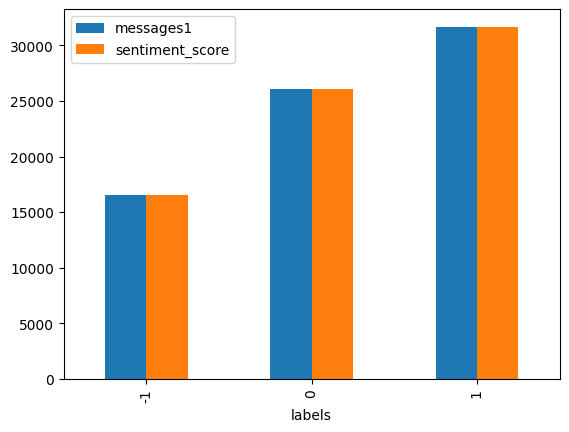

In [ ]:
# The distribution of sentiments
data.groupby('labels').count().plot( kind='bar' )

In [44]:
data['label'] = data['labels'].map({-1.0:'Negative', 0.0:'Neutral', 1.0:'Positive'})

C:\Users\Ayush\AppData\Local\Temp\ipykernel_14736\1590538891.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['label'] = data['labels'].map({-1.0:'Negative', 0.0:'Neutral', 1.0:'Positive'})


C:\Users\Ayush\AppData\Local\Temp\ipykernel_14736\501604721.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['length'] = data.messages1.str.split().apply(len)


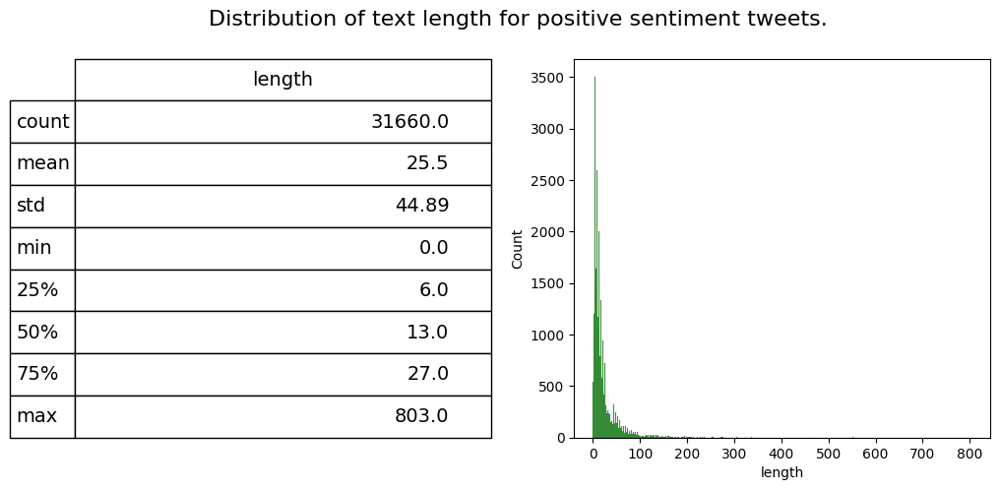

In [46]:
#Plotting the distribution of text length for positive sentiment Data
fig = plt.figure(figsize=(12,5))
data['length'] = data.messages1.str.split().apply(len)
ax1 = fig.add_subplot(122)
sns.histplot(data[data['label']=='Positive']['length'], ax=ax1,color='green')
describe = data.length[data.label=='Positive'].describe().to_frame().round(2)

ax2 = fig.add_subplot(121)
ax2.axis('off')
font_size = 14
bbox = [0, 0, 1, 1]
table = ax2.table(cellText = describe.values, rowLabels = describe.index, bbox=bbox, colLabels=describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of text length for positive sentiment tweets.', fontsize=16)

plt.show()

C:\Users\Ayush\AppData\Local\Temp\ipykernel_14736\62156218.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['length'] = data.messages1.str.split().apply(len)


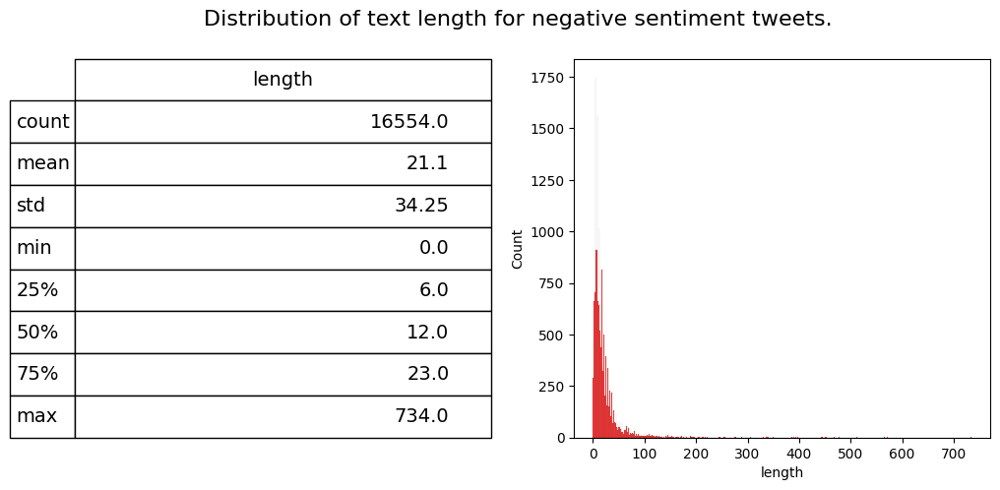

In [47]:
#Plotting the distribution of text length for Negative sentiment Data
fig = plt.figure(figsize=(12,5))
data['length'] = data.messages1.str.split().apply(len)
ax1 = fig.add_subplot(122)
sns.histplot(data[data['label']=='Negative']['length'], ax=ax1,color='red')
describe = data.length[data.label=='Negative'].describe().to_frame().round(2)

ax2 = fig.add_subplot(121)
ax2.axis('off')
font_size = 14
bbox = [0, 0, 1, 1]
table = ax2.table(cellText = describe.values, rowLabels = describe.index, bbox=bbox, colLabels=describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of text length for negative sentiment tweets.', fontsize=16)

plt.show()

C:\Users\Ayush\AppData\Local\Temp\ipykernel_14736\2264209829.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['length'] = data.messages1.str.split().apply(len)


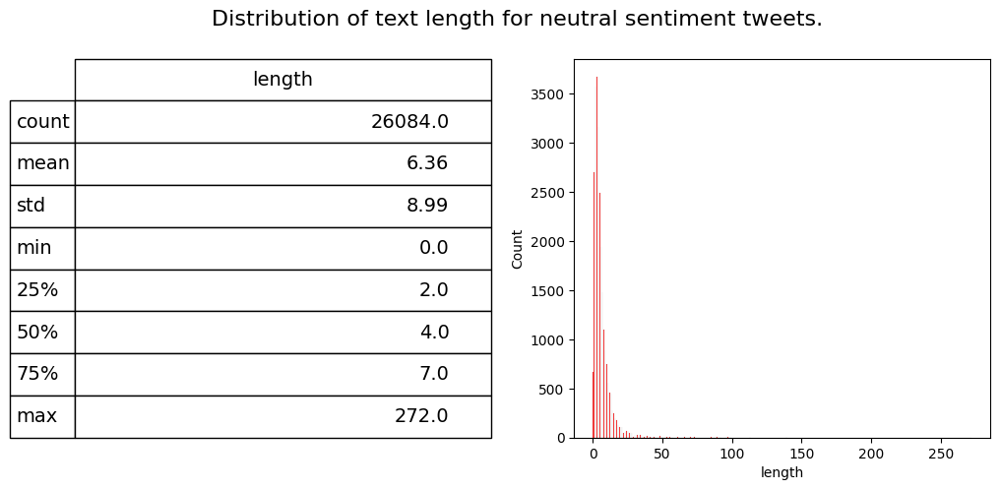

In [48]:
#Plotting the distribution of text length for Neutral sentiment Data
fig = plt.figure(figsize=(12,5))
data['length'] = data.messages1.str.split().apply(len)
ax1 = fig.add_subplot(122)
sns.histplot(data[data['label']=='Neutral']['length'], ax=ax1,color='red')
describe = data.length[data.label=='Neutral'].describe().to_frame().round(2)

ax2 = fig.add_subplot(121)
ax2.axis('off')
font_size = 14
bbox = [0, 0, 1, 1]
table = ax2.table(cellText = describe.values, rowLabels = describe.index, bbox=bbox, colLabels=describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of text length for neutral sentiment tweets.', fontsize=16)

plt.show()

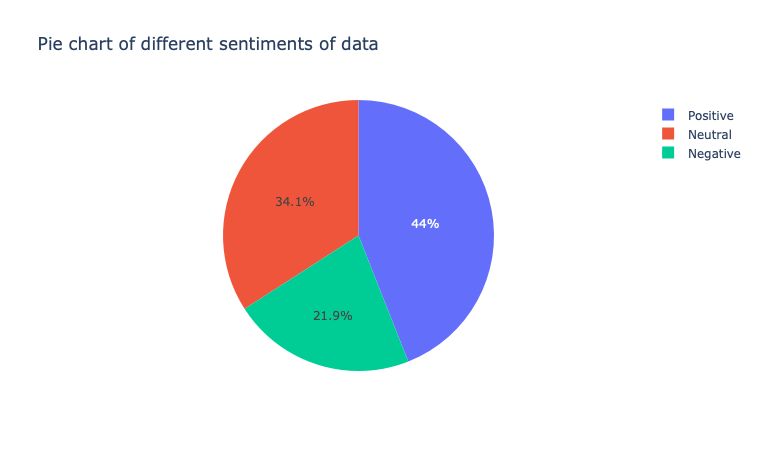

In [66]:
import plotly.express as px
fig = px.pie(data, names='label', title ='Pie chart of different sentiments of data')
fig.show()

In [70]:
# data.drop(['length'], axis=1, inplace=True)
# data.head

In [75]:
data.info()

<class 'pandas.core.frame.DataFrame'>

Index: 200118 entries, 0 to 200228

Data columns (total 4 columns):

 #   Column           Non-Null Count   Dtype  

---  ------           --------------   -----  

 0   labels           200118 non-null  float64

 1   messages1        200118 non-null  object 

 2   sentiment_score  200118 non-null  float64

 3   label            200118 non-null  object 

dtypes: float64(2), object(2)

memory usage: 7.6+ MB


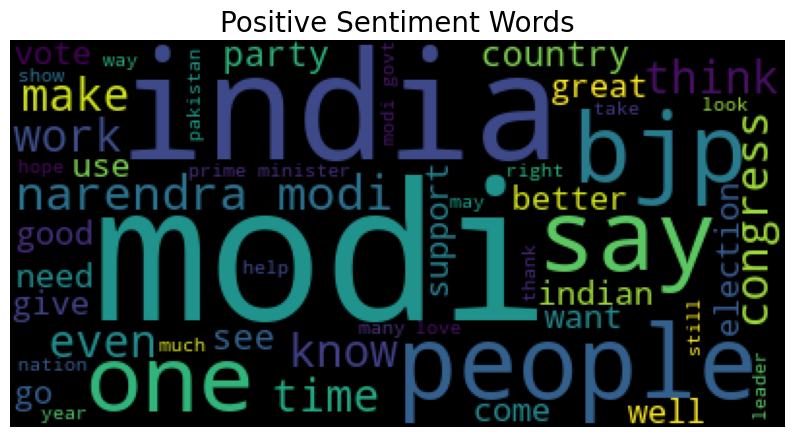

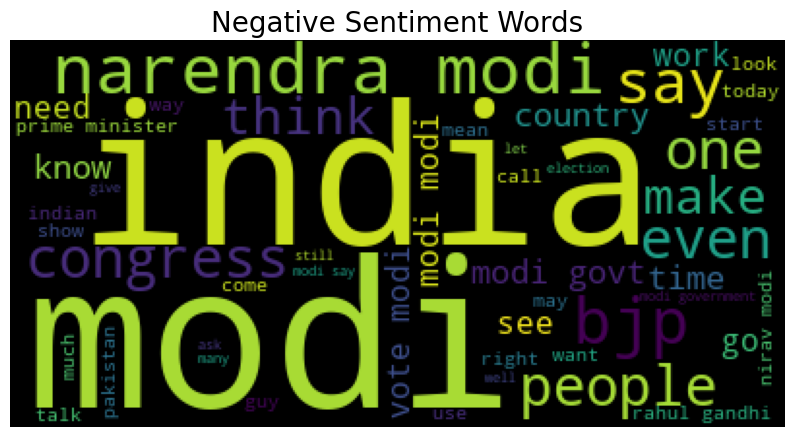

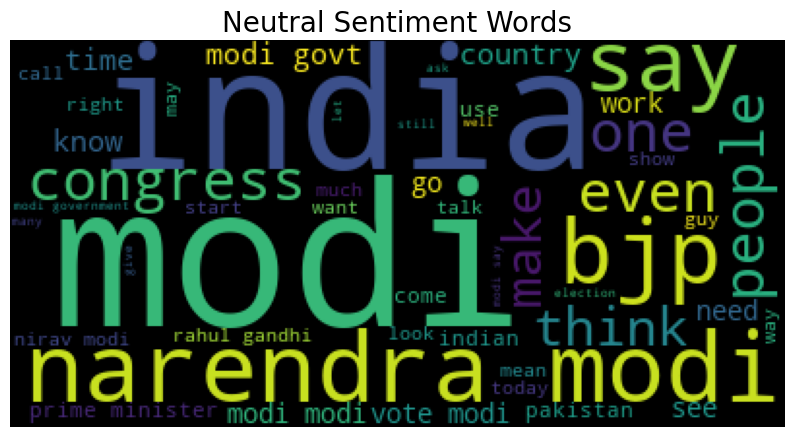

In [96]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
def wordcount_gen(df, category, sentiment_column='sentiment_score'):
              """
              Generating Word Cloud

              Inputs:
                - df: DataFrame containing the data
                - category: Positive/Negative/Neutral
                - sentiment_column (optional): Name of the column containing sentiment score (default: 'sentiment_score')
              """

              # Filter data based on sentiment
              filtered_data = df[df[sentiment_column] > 0.5] if category == 'Positive' else df[df[sentiment_column] <= 0.5]

              # Combine all messages from the filtered data
              combined_tweets = " ".join(filtered_data['messages1'])

              # Initialize wordcloud object
              wc = WordCloud(background_color='black',
                              max_words=50,
                              stopwords=STOPWORDS)

              # Generate and plot wordcloud
              plt.figure(figsize=(10, 10))
              plt.imshow(wc.generate(combined_tweets))
              plt.title('{} Sentiment Words'.format(category), fontsize=20)
              plt.axis('off')
              plt.show()
#Positive tweet words
wordcount_gen(data, 'Positive')

# Negative tweet words
wordcount_gen(data, 'Negative')

# Neutral tweet words (assuming sentiment_column < 0.5 is neutral)
wordcount_gen(data, 'Neutral')

       

In [101]:
# data.drop(['label'], axis=1, inplace=True)
# data.head()

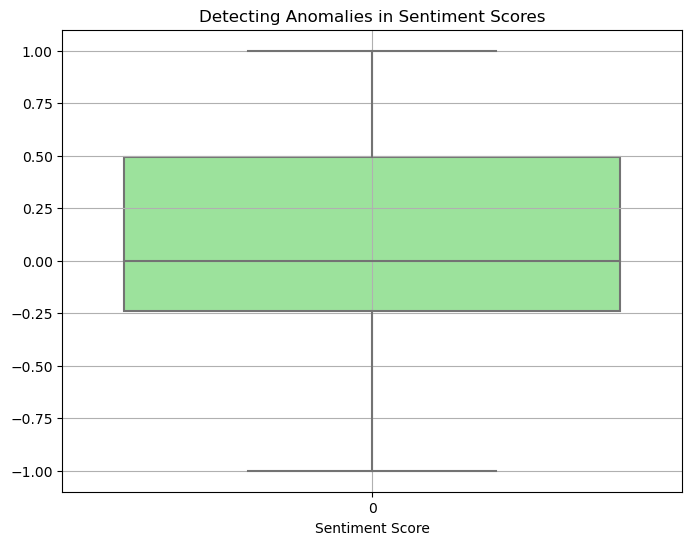

In [108]:
# Detect anomalies or outliers in sentiment scores
plt.figure(figsize=(8, 6))
sns.boxplot(data['sentiment_score'], color='lightgreen')
plt.title('Detecting Anomalies in Sentiment Scores')
plt.xlabel('Sentiment Score')
plt.grid(True)
plt.show()

In [54]:
data

,labels,messages1,sentiment_score,label,length
0,1,family mormon try explain stare puzzle time ti...,0.9423,Positive,24
1,1,buddhism lot compatible christianity especiall...,0.9944,Positive,117
2,-1,seriously don thing win complex explain normal...,0.8779,Negative,37
3,0,learn want teach different focus goal not wrap...,0.0772,Neutral,13
4,1,benefit want read live buddha live christ thic...,0.9020,Positive,58
...,...,...,...,...,...
74493,0,jesus,0.0000,Neutral,1
74494,1,kya bhai pure saal chutiya banaya modi aur jab...,0.0000,Positive,19
74495,0,downvote karna tha par upvote hogaya,0.0000,Neutral,6
74496,1,haha nice,0.7003,Positive,2


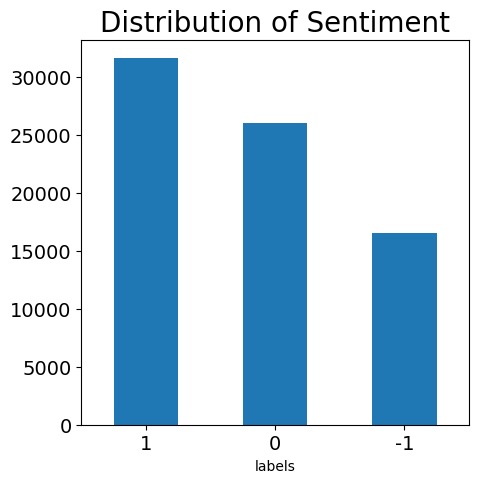

In [ ]:
fig , ax = plt.subplots(figsize = (5,5))
ax = data['labels'].value_counts().plot(kind = 'bar')

plt.xticks(rotation = 0, size = 14)
plt.yticks(size = 14, color = 'black')
plt.title('Distribution of Sentiment', size = 20)

ax.annotate(text = data['labels'].value_counts().values[0], xy = (-0.13,88079), size = 18)
ax.annotate(text = data['labels'].value_counts().values[1], xy = (0.87,68253), size = 18)
ax.annotate(text = data['labels'].value_counts().values[2], xy = (1.87,43786), size = 18)

plt.show()

# Train & Test Split

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report


In [82]:
# saving the data as a csv file
data.to_csv( "processed_data.csv" , index = False )

In [56]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 74298 entries, 0 to 74497
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   labels           74298 non-null  int64  
 1   messages1        74298 non-null  object 
 2   sentiment_score  74298 non-null  float64
 3   label            74298 non-null  object 
 4   length           74298 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 3.4+ MB


In [3]:
data = pd.read_csv("processed_data.csv") 

In [4]:
#Finding X and y
X = data['messages1']
y = data['labels']


In [5]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)


In [16]:
X_test

70566    pure land focus heavily case primarily idea po...
53927                                                india
22526    people need elaborate mean democracy people re...
4609                                       doesn lock bike
57180    article adblocker unfriendly follow text artic...
                               ...                        
52654    don nda politician steal money but upa didn ri...
36718    rss poison flow nation assertion build falseho...
47459             camera take pic pic look directly camera
28435    hope dick measuring contest stop soon possible...
896      arvind kejriwal time well congress opposition ...
Name: messages1, Length: 7430, dtype: object

In [7]:
##Vectorize text data
# Initialize TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer()
X_train = X_train.fillna('')
X_test = X_test.fillna('')


# Fit and transform the training data
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)

# Transform the testing data
X_test_tfidf = tfidf_vectorizer.transform(X_test)


In [83]:
joblib.dump(tfidf_vectorizer  , "tfidf_vectorizer.pkl" ) 

['tfidf_vectorizer.pkl']

In [8]:
feature_names = tfidf_vectorizer.get_feature_names_out()

print(X_test_tfidf.shape)

(7430, 42082)


# Logistic Regression

In [66]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Initialize logistic regression model
log_reg_model = LogisticRegression()

# Train the logistic regression model on the training data
log_reg_model.fit(X_train_tfidf, y_train)


e:\twitter-and-reddit-sentimental-analysis\.env\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add a L2 penalty term and it is the default choice;- `'l1'`: add a L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'` and `l1_ratio` set to any float between 0 and 1 for `'penalty='elasticnet'`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation `) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001
,"fit_intercept fit_intercept: bool, default=TrueSpecifies if a constant (a.k.a. bias or intercept) should beadded to the decision function.",True
,"intercept_scaling intercept_scaling: float, default=1Useful only when the solver `liblinear` is usedand `self.fit_intercept` is set to `True`. In this case, `x` becomes`[x, self.intercept_scaling]`,i.e. a ""synthetic"" feature with constant value equal to`intercept_scaling` is appended to the instance vector.The intercept becomes``intercept_scaling * synthetic_feature_weight``... note:: The synthetic feature weight is subject to L1 or L2 regularization as all other features. To lessen the effect of regularization on synthetic feature weight (and therefore on the intercept) `intercept_scaling` has to be increased.",1
,"class_weight class_weight: dict or 'balanced', default=NoneWeights associated with classes in the form ``{class_label: weight}``.If not given, all classes are supposed to have weight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.Note that these weights will be multiplied with sample_weight (passedthrough the fit method) if sample_weight is specified... versionadded:: 0.17 *class_weight='balanced'*",None
,"random_state random_state: int, RandomState instance, default=NoneUsed when ``solver`` == 'sag', 'saga' or 'liblinear' to shuffle thedata. See :term:`Glossary ` for details.",None
,"solver solver: {'lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'}, default='lbfgs'Algorithm to use in the optimization problem. Default is 'lbfgs'.To choose a solver, you might want to consider the following aspects:- 'lbfgs' is a good default solver because it works reasonably well for a wide class of problems.- For :term:`mul

In [81]:
joblib.dump(log_reg_model , "logistic_regression_model.pkl" )

['logistic_regression_model.pkl']

In [67]:
# Predict on the testing data
y_pred_log_reg = log_reg_model.predict(X_test_tfidf)

In [68]:
# Calculate accuracy
accuracy_log_reg = accuracy_score(y_test, y_pred_log_reg)
print("Logistic Regression Accuracy:", accuracy_log_reg)

Logistic Regression Accuracy: 0.8527590847913863


In [69]:
# Generate confusion matrix
conf_matrix_log_reg = confusion_matrix(y_test, y_pred_log_reg)
print("Logistic Regression Confusion Matrix:")
print(conf_matrix_log_reg)


Logistic Regression Confusion Matrix:
[[1161  232  275]
 [  33 2406  117]
 [ 139  298 2769]]


In [34]:
#pip install scikit-plot

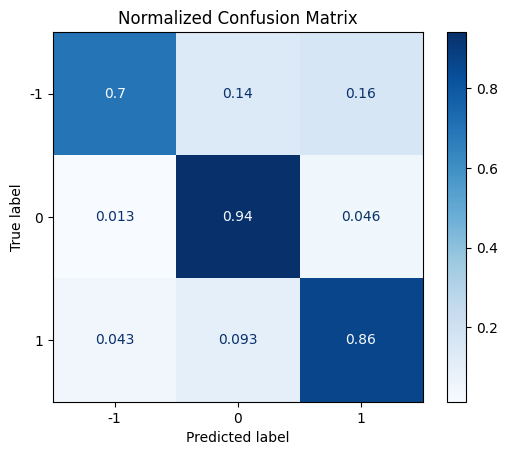

In [76]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import ConfusionMatrixDisplay

class_labels = np.unique(y_test)

ConfusionMatrixDisplay.from_predictions(
    y_test,
    y_pred_log_reg,
    labels=class_labels,
    normalize="true",
    cmap=plt.cm.Blues
)

plt.title("Normalized Confusion Matrix")
plt.show()


In [77]:
# Generate classification report
report_log_reg = classification_report(y_test, y_pred_log_reg)
print("Logistic Regression Classification Report:")
print(report_log_reg)

Logistic Regression Classification Report:
              precision    recall  f1-score   support

          -1       0.87      0.70      0.77      1668
           0       0.82      0.94      0.88      2556
           1       0.88      0.86      0.87      3206

    accuracy                           0.85      7430
   macro avg       0.86      0.83      0.84      7430
weighted avg       0.86      0.85      0.85      7430



# Support Vector Machine (SVM)

In [78]:
from sklearn.svm import SVC

# Initialize SVM model
svm_model = SVC()

# Train the SVM model on the training data
svm_model.fit(X_train_tfidf, y_train)

,"C C: float, default=1.0Regularization parameter. The strength of the regularization isinversely proportional to C. Must be strictly positive. The penaltyis a squared l2 penalty. For an intuitive visualization of the effectsof scaling the regularization parameter C, see:ref:`sphx_glr_auto_examples_svm_plot_svm_scale_c.py`.",1.0
,"kernel kernel: {'linear', 'poly', 'rbf', 'sigmoid', 'precomputed'} or callable, default='rbf'Specifies the kernel type to be used in the algorithm. Ifnone is given, 'rbf' will be used. If a callable is given it is used topre-compute the kernel matrix from data matrices; that matrix should bean array of shape ``(n_samples, n_samples)``. For an intuitivevisualization of different kernel types see:ref:`sphx_glr_auto_examples_svm_plot_svm_kernels.py`.",'rbf'
,"degree degree: int, default=3Degree of the polynomial kernel function ('poly').Must be non-negative. Ignored by all other kernels.",3
,"gamma gamma: {'scale', 'auto'} or float, default='scale'Kernel coefficient for 'rbf', 'poly' and 'sigmoid'.- if ``gamma='scale'`` (default) is passed then it uses 1 / (n_features * X.var()) as value of gamma,- if 'auto', uses 1 / n_features- if float, must be non-negative... versionchanged:: 0.22 The default value of ``gamma`` changed from 'auto' to 'scale'.",'scale'
,"coef0 coef0: float, default=0.0Independent term in kernel function.It is only significant in 'poly' and 'sigmoid'.",0.0
,"shrinking shrinking: bool, default=TrueWhether to use the shrinking heuristic.See the :ref:`User Guide `.",True
,"probability probability: bool, default=FalseWhether to enable probability estimates. This must be enabled priorto calling `fit`, will slow down that method as it internally uses5-fold cross-validation, and `predict_proba` may be inconsistent with`predict`. Read more in the :ref:`User Guide `.",False
,"tol tol: float, default=1e-3Tolerance for stopping criterion.",0.001
,"cache_size cache_size: float, default=200Specify the size of the kernel cache (in MB).",200
,"class_weight class_weight: dict or 'balanced', default=NoneSet the parameter C of class i to class_weight[i]*C forSVC. If not given, all classes are supposed to haveweight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.",None
,"verbose verbose: bool, default=FalseEnable verbose output. Note that this setting takes advantage of aper-process runtime setting in libsvm that, if enabled, may not workproperly in a multithreaded context.",False


In [80]:
import joblib
joblib.dump( svm_model , 'svm_model.pkl') 


['svm_model.pkl']

In [84]:
# Predict on the testing data
y_pred_svm = svm_model.predict(X_test_tfidf)


In [85]:
# Calculate accuracy
accuracy_svm = accuracy_score(y_test, y_pred_svm)
print("SVM Accuracy:", accuracy_svm)

SVM Accuracy: 0.9572005383580081


In [86]:
# Generate confusion matrix
conf_matrix_svm = confusion_matrix(y_test, y_pred_svm)
print("SVM Confusion Matrix:")
print(conf_matrix_svm)

SVM Confusion Matrix:
[[1522   71   75]
 [  12 2513   31]
 [  39   90 3077]]


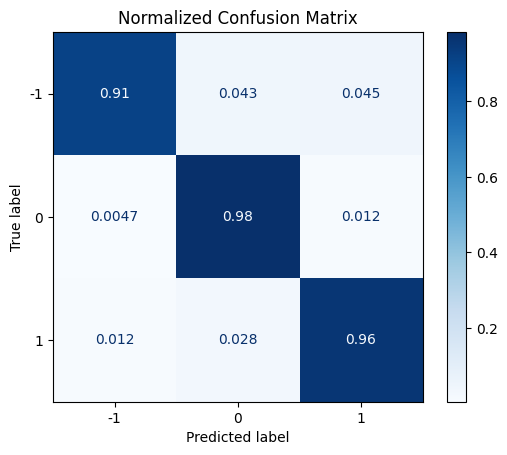

In [87]:
class_labels = np.unique(y_test)

ConfusionMatrixDisplay.from_predictions(
    y_test,
    y_pred_svm,
    labels=class_labels,
    normalize="true",
    cmap=plt.cm.Blues
)

plt.title("Normalized Confusion Matrix")
plt.show()


In [88]:
# Generate classification report
report_svm = classification_report(y_test, y_pred_svm)
print("SVM Classification Report:")
print(report_svm)


SVM Classification Report:
              precision    recall  f1-score   support

          -1       0.97      0.91      0.94      1668
           0       0.94      0.98      0.96      2556
           1       0.97      0.96      0.96      3206

    accuracy                           0.96      7430
   macro avg       0.96      0.95      0.95      7430
weighted avg       0.96      0.96      0.96      7430



# RandomForestClassifier

In [89]:
from sklearn.ensemble import RandomForestClassifier

# Initialize RandomForest Classifier model
rf_model = RandomForestClassifier(n_estimators=100, max_depth=10)

# Train the RandomForest Classifier model on the training data
rf_model.fit(X_train_tfidf, y_train)

,"n_estimators n_estimators: int, default=100The number of trees in the forest... versionchanged:: 0.22 The default value of ``n_estimators`` changed from 10 to 100 in 0.22.",100
,"criterion criterion: {""gini"", ""entropy"", ""log_loss""}, default=""gini""The function to measure the quality of a split. Supported criteria are""gini"" for the Gini impurity and ""log_loss"" and ""entropy"" both for theShannon information gain, see :ref:`tree_mathematical_formulation`.Note: This parameter is tree-specific.",'gini'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",10
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: {""sqrt"", ""log2"", None}, int or float, default=""sqrt""The number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None, then `max_features=n_features`... versionchanged:: 1.1 The default of `max_features` changed from `""auto""` to `""sqrt""`.Note: the search for a split does not stop until at least onevalid partition of the node samples is found, even if it requires toeffectively inspect more than ``max_features`` features.",'sqrt'
,"max_leaf_nodes max_leaf_nodes: int, default=NoneGrow trees with ``max_leaf_nodes`` in best-first fashion.Best nodes are defined as relative reduction in impurity.If None then unlimited number of leaf nodes.",None
,"min_impurity_decrease min_impurity_decrease: float, default=0.0A node will be split if this split induces a decrease of the impuritygreater than or equal to this value.The weighted impurity decrease equation is the following:: N_t / N * (impurity - N_t_R / N_t * right_impurity - N_t_L / N_t * left_impurity)where ``N`` is the total number of samples, ``N_t`` is the number ofsamples at the current node, ``N_t_L`` is the number of samples in theleft child, and ``N_t_R`` is the number of samples in the right child.``N``, ``N_t``, ``N_t_R`` and ``N_t_L`` all refer to the weighted sum,if ``sample_weight`` is passed... versionadded:: 0.19",0.0
,"bootstrap bootstrap: bool, default=TrueWhether bootstrap samples are used when building trees. If False, thewhole dataset is used to build each tree.",True
,"oob_score oob_score: bool or callable, default=FalseWhether to use out-of-bag samples to estimate the generalization score.By default, :func:`~sklearn.metrics.accuracy_score` is used.Provide a callable with signature `metric(y

In [90]:
joblib.dump( rf_model  , "random_forest_model.pkl")

['random_forest_model.pkl']

In [91]:
# Predict on the testing data
y_pred_rf = rf_model.predict(X_test_tfidf)


In [94]:
# Calculate accuracy
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print("RandomForest Classifier Accuracy:", accuracy_rf)


# Generate classification report
report_rf = classification_report(y_test, y_pred_rf)
print("RandomForest Classifier Classification Report:")
print(report_rf)

RandomForest Classifier Accuracy: 0.44414535666218036
RandomForest Classifier Classification Report:
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00      1668
           0       0.94      0.04      0.07      2556
           1       0.44      1.00      0.61      3206

    accuracy                           0.44      7430
   macro avg       0.46      0.35      0.23      7430
weighted avg       0.51      0.44      0.29      7430



e:\twitter-and-reddit-sentimental-analysis\.env\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
e:\twitter-and-reddit-sentimental-analysis\.env\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
e:\twitter-and-reddit-sentimental-analysis\.env\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{me

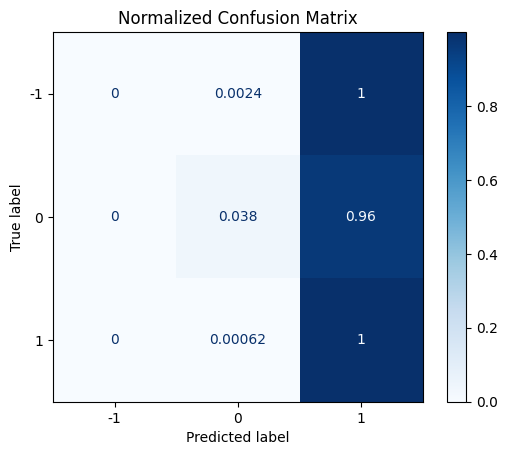

In [93]:
class_labels = np.unique(y_test)

ConfusionMatrixDisplay.from_predictions(
    y_test,
    y_pred_rf,
    labels=class_labels,
    normalize="true",
    cmap=plt.cm.Blues
)

plt.title("Normalized Confusion Matrix")
plt.show()


# GradientBoostingClassifier

In [96]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Initialize GradientBoostingClassifier model
gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1)

# Train the GradientBoostingClassifier model on the training data
gb_model.fit(X_train_tfidf, y_train)


,"loss loss: {'log_loss', 'exponential'}, default='log_loss'The loss function to be optimized. 'log_loss' refers to binomial andmultinomial deviance, the same as used in logistic regression.It is a good choice for classification with probabilistic outputs.For loss 'exponential', gradient boosting recovers the AdaBoost algorithm.",'log_loss'
,"learning_rate learning_rate: float, default=0.1Learning rate shrinks the contribution of each tree by `learning_rate`.There is a trade-off between learning_rate and n_estimators.Values must be in the range `[0.0, inf)`.For an example of the effects of this parameter and its interaction with``subsample``, see:ref:`sphx_glr_auto_examples_ensemble_plot_gradient_boosting_regularization.py`.",0.1
,"n_estimators n_estimators: int, default=100The number of boosting stages to perform. Gradient boostingis fairly robust to over-fitting so a large number usuallyresults in better performance.Values must be in the range `[1, inf)`.",100
,"subsample subsample: float, default=1.0The fraction of samples to be used for fitting the individual baselearners. If smaller than 1.0 this results in Stochastic GradientBoosting. `subsample` interacts with the parameter `n_estimators`.Choosing `subsample < 1.0` leads to a reduction of varianceand an increase in bias.Values must be in the range `(0.0, 1.0]`.",1.0
,"criterion criterion: {'friedman_mse', 'squared_error'}, default='friedman_mse'The function to measure the quality of a split. Supported criteria are'friedman_mse' for the mean squared error with improvement score byFriedman, 'squared_error' for mean squared error. The default value of'friedman_mse' is generally the best as it can provide a betterapproximation in some cases... versionadded:: 0.18",'friedman_mse'
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, values must be in the range `[2, inf)`.- If float, values must be in the range `(0.0, 1.0]` and `min_samples_split` will be `ceil(min_samples_split * n_samples)`... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, values must be in the range `[1, inf)`.- If float, values must be in the range `(0.0, 1.0)` and `min_samples_leaf` will be `ceil(min_samples_leaf * n_samples)`... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.Values must be in the range `[0.0, 0.5]`.",0.0
,"max_depth max_depth: int or None, default=3Maximum depth of the individual regression estimators. The maximumdepth limits the number of nodes in the tree. Tune this parameterfor best performance; the best value depends on the interactionof the input variables. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.If int, values must be in the range `[1, inf)`.",3
,"min_impurity_decrease min_impurity_decrease: float, default=0.0A node will be split if this split induces a decrease of the impuritygreater than or equal to this value.Values must be in the range `[0.0, inf)`.The weighted impurity decrease equation is the following:: N_t / N * (impurity - N_t_R / N_t * right_impurity - N_t_L / N_t * left_impurity)where ``N`` is the total number of samples, ``N_t`` is the number ofsamples at the current node, ``N_t_L`` is the number of samples in theleft child, and ``N_t_R`` is the number of samples in the right child.``N``, ``N_t``, 

In [97]:
joblib.dump( gb_model , "gradient_boosting_model.pkl") 

['gradient_boosting_model.pkl']

In [98]:
# Predict on the testing data
y_pred_gb = gb_model.predict(X_test_tfidf)

# Calculate accuracy
accuracy_gb = accuracy_score(y_test, y_pred_gb)
print("GradientBoostingClassifier Accuracy:", accuracy_gb)


GradientBoostingClassifier Accuracy: 0.7200538358008075


GradientBoostingClassifier Confusion Matrix:
[[ 648  552  468]
 [  13 2376  167]
 [ 121  759 2326]]


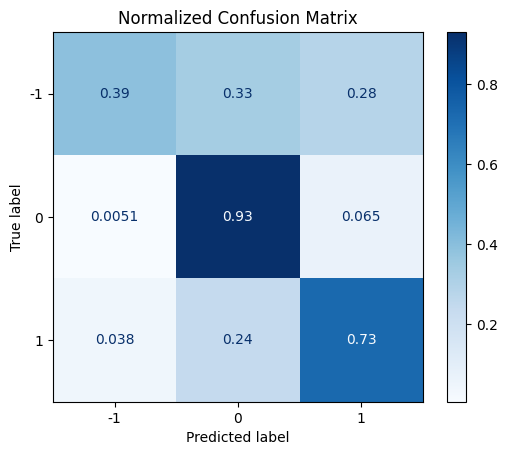

In [99]:
# Generate confusion matrix
conf_matrix_gb = confusion_matrix(y_test, y_pred_gb)
print("GradientBoostingClassifier Confusion Matrix:")
print(conf_matrix_gb)

class_labels = np.unique(y_test)

ConfusionMatrixDisplay.from_predictions(
    y_test,
    y_pred_gb,
    normalize="true",
    cmap=plt.cm.Blues
)

plt.title("Normalized Confusion Matrix")
plt.show()


In [100]:

# Generate classification report
report_gb = classification_report(y_test, y_pred_gb)
print("GradientBoostingClassifier Classification Report:")
print(report_gb)

GradientBoostingClassifier Classification Report:
              precision    recall  f1-score   support

          -1       0.83      0.39      0.53      1668
           0       0.64      0.93      0.76      2556
           1       0.79      0.73      0.75      3206

    accuracy                           0.72      7430
   macro avg       0.75      0.68      0.68      7430
weighted avg       0.75      0.72      0.71      7430



# AdaBoostClassifier

In [101]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Initialize AdaBoostClassifier model
ada_model = AdaBoostClassifier(n_estimators=50, learning_rate=1.0)

# Train the AdaBoostClassifier model on the training data
ada_model.fit(X_train_tfidf, y_train)

,"estimator estimator: object, default=NoneThe base estimator from which the boosted ensemble is built.Support for sample weighting is required, as well as proper``classes_`` and ``n_classes_`` attributes. If ``None``, thenthe base estimator is :class:`~sklearn.tree.DecisionTreeClassifier`initialized with `max_depth=1`... versionadded:: 1.2 `base_estimator` was renamed to `estimator`.",None
,"n_estimators n_estimators: int, default=50The maximum number of estimators at which boosting is terminated.In case of perfect fit, the learning procedure is stopped early.Values must be in the range `[1, inf)`.",50
,"learning_rate learning_rate: float, default=1.0Weight applied to each classifier at each boosting iteration. A higherlearning rate increases the contribution of each classifier. There isa trade-off between the `learning_rate` and `n_estimators` parameters.Values must be in the range `(0.0, inf)`.",1.0
,"random_state random_state: int, RandomState instance or None, default=NoneControls the random seed given at each `estimator` at eachboosting iteration.Thus, it is only used when `estimator` exposes a `random_state`.Pass an int for reproducible output across multiple function calls.See :term:`Glossary `.",None


In [102]:
joblib.dump( ada_model , "ada_boost_model.pkl" ) 

['ada_boost_model.pkl']

In [103]:
# Predict on the testing data
y_pred_ada = ada_model.predict(X_test_tfidf)

# Calculate accuracy
accuracy_ada = accuracy_score(y_test, y_pred_ada)
print("AdaBoostClassifier Accuracy:", accuracy_ada)

AdaBoostClassifier Accuracy: 0.5746971736204576


In [ ]:
# Generate confusion matrix
conf_matrix_ada = confusion_matrix(y_test, y_pred_ada)
print("AdaBoostClassifier Confusion Matrix:")
print(conf_matrix_ada)

# Generate classification report
report_ada = classification_report(y_test, y_pred_ada)
print("AdaBoostClassifier Classification Report:")
print(report_ada)


# LGBMClassifier

In [110]:
import lightgbm
import sklearn
print(lightgbm.__version__)
print(sklearn.__version__)


4.5.0
1.8.0


In [9]:
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Initialize LGBMClassifier model
lbgm_model = joblib.load( r"E:\twitter-and-reddit-sentimental-analysis\lgbm_model.pkl") 


e:\twitter-and-reddit-sentimental-analysis\.env\Lib\site-packages\sklearn\base.py:463: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.6.1 when using version 1.8.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [10]:
# Predict on the testing data
y_pred_lgbm = lbgm_model.predict( X_test_tfidf)

# Calculate accuracy
accuracy_lgbm = accuracy_score(y_test, y_pred_lgbm)
print("LGBMClassifier Accuracy:", accuracy_lgbm)


LGBMClassifier Accuracy: 0.8526244952893675


e:\twitter-and-reddit-sentimental-analysis\.env\Lib\site-packages\sklearn\utils\validation.py:2691: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


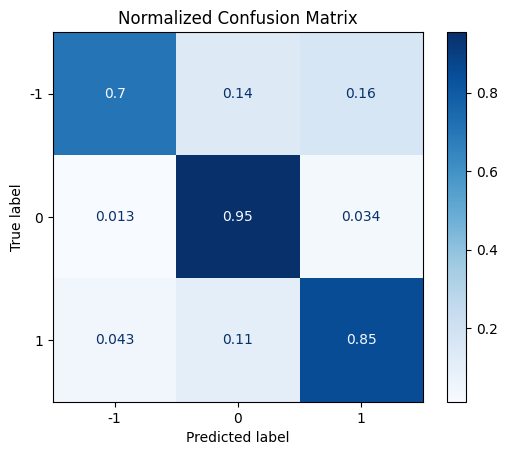

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import ConfusionMatrixDisplay

class_labels = np.unique( y_test )

ConfusionMatrixDisplay.from_predictions(
    y_test , 
    y_pred_lgbm ,
    labels = class_labels , 
    normalize = "true" , 
    cmap = plt.cm.Blues )

plt.title("Normalized Confusion Matrix")
plt.show()


In [11]:
# Generate confusion matrix
conf_matrix_lgbm = confusion_matrix(y_test, y_pred_lgbm)
print("LGBMClassifier Confusion Matrix:")
print(conf_matrix_lgbm)

# Generate classification report
report_lgbm = classification_report(y_test, y_pred_lgbm)
print("LGBMClassifier Classification Report:")
print(report_lgbm)

LGBMClassifier Confusion Matrix:
[[1174  226  268]
 [  32 2438   86]
 [ 138  345 2723]]
LGBMClassifier Classification Report:
              precision    recall  f1-score   support

          -1       0.87      0.70      0.78      1668
           0       0.81      0.95      0.88      2556
           1       0.88      0.85      0.87      3206

    accuracy                           0.85      7430
   macro avg       0.86      0.84      0.84      7430
weighted avg       0.86      0.85      0.85      7430



In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier

classifiers = {
    "LogisticRegression": LogisticRegression(),
    "SVC": SVC(),
    "KNeighborsClassifier": KNeighborsClassifier(),
    "GradientBoostingClassifier": GradientBoostingClassifier(),
    "AdaBoostClassifier": AdaBoostClassifier(),
    "XGBClassifier": XGBClassifier(),
    "LGBMClassifier": LGBMClassifier(),
    "GaussianNB": GaussianNB(),
    "MLPClassifier": MLPClassifier(),
    "RandomForestClassifier": RandomForestClassifier(),
    "DecisionTreeClassifier": DecisionTreeClassifier()
}

# Loop through each classifier
for name, classifier in classifiers.items():
    # Train the classifier
    classifier.fit(X_train, y_train)
    
    # Make predictions
    y_pred = classifier.predict(X_test)
    
    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    print(f"{name} Accuracy: {accuracy}")
    
    # Generate confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    print(f"{name} Confusion Matrix:")
    print(conf_matrix)
    
    # Generate classification report
    report = classification_report(y_test, y_pred)
    print(f"{name} Classification Report:")
    print(report)
    print()
